<h1 style="text-align: center;">Anleitung</h1>


# Inhaltsverzeichnis
1. [Einleitung](#introduction)
2. [Kurzvorstellung der Module](#short_intro)
2. [Einbindung der Module](#modul)
4. [Funktionsumfang DBHandler](#DBHandler)
5. [Funktionsumfang AnalyticsHandler](#Analytics)

## 1. Einleitung <a name="introduction"></a>
In dieser Anleitung werden wir uns auf die Funktionalitäten der beiden Module "DBHandler" und "AnalyticsHandler" konzentrieren. Diese Module bieten eine Reihe von leistungsfähigen Werkzeugen zur Bearbeitung und Analyse von Sensordaten des AirQ-Geräts. Durch eine Reihe von praktischen Beispielen werden wir Ihnen zeigen, wie Sie diese Funktionen effektiv nutzen können, um eigenständige Datenanalysen durchzuführen. Unser Ziel ist es, Ihnen zu ermöglichen, die volle Kontrolle über Ihre Daten zu erlangen und Ihre individuellen Analysen auf einem soliden Verständnis dieser leistungsstarken Tools aufzubauen.

## 2. Kurzvorstellung der Module <a name="short_intro"></a>
Das DBHandler-Modul bietet ein effizientes Management Ihrer Datenbank und ermöglicht das Abrufen und Speichern von Daten aus dem AirQ-Sensor. Mit den nützlichen Funktionen dieses Moduls können Sie auf einfache Weise Daten abrufen, in der Datenbank speichern und die gespeicherten Daten löschen oder in eine CSV-Datei exportieren.

Das AnalyticsHandler-Modul ist Ihr Werkzeugkasten für die Datenanalyse. Es bietet eine umfassende Palette an Funktionen für die Korrelationsanalyse und ermöglicht Ihnen die Erstellung von aussagekräftigen Scatter- und Lineplots. Dieses Modul unterstützt Sie dabei, tiefergehende Einblicke in Ihre Daten zu gewinnen und Ihre Analyseergebnisse visuell darzustellen.

## 3. Einbindung der Module <a name="modul"></a>

Um die Funktionen der beiden Module zu nutzen, ist es erforderlich, sie in Ihre Datei zu importieren.
Dabei gibt es Zwei Möglichkeiten. Wenn Ihre Datei im gleichen Verzeichnis liegt wie die beiden Dateien der Module, dann können Sie die Module einfach über den Import-Befehl einbinden.

Wenn Sie in einer neuen Datei versuchen die Module einzubinden kann es sein, dass Sie zuerst Ihre Datei speichen müssen damit der import funktioniert.

In [30]:
import AnalyticsHandler
import DBHandler

Sollte dies nicht der Fall sein, dann müssen Sie zuerst den Dateipfad zu den beiden Modul-Dateien angeben.

In [31]:
"""
import sys
sys.path.append("/pfad/zum/verzeichnis")

import AnalyticsHandler
import DBHandler
"""

'\nimport sys\nsys.path.append("/pfad/zum/verzeichnis")\n\nimport AnalyticsHandler\nimport DBHandler\n'

# 4. Funktionsumfang DBHandler <a name="DBHandler"></a>
Um ein Klassenobjet des Handlers zu erzeugen wird diese Befehlsstruktur verwendet:

In [32]:
dbhandler = DBHandler.DBHandler()

Wenn Sie sich einen Überblick über den Funktionsumfang und dessen Benutzung verschaffen wollen bietet sich der Befehl "help()" an.

In [33]:
help(dbhandler)

Help on DBHandler in module DBHandler object:

class DBHandler(builtins.object)
 |  DBHandler(airqIP='192.168.4.1', airqpass='airqsetup')
 |  
 |  This class contains all functions needed to operate the database and to request data from the AirQ-Sensor. 
 |  
 |      Args:
 |          airqIP (str, optional): IP-Address of the AirQ-Sensor. Defaults to '192.168.4.1'.
 |          airqpass (str, optional): Password of the AirQ-Sensor. Defaults to 'airqsetup'.
 |  
 |  Methods defined here:
 |  
 |  __init__(self, airqIP='192.168.4.1', airqpass='airqsetup')
 |      Constructor-method
 |      
 |      Args:
 |          airqIP (str, optional): IP-Address of the AirQ-Sensor. Defaults to '192.168.4.1'.
 |          airqpass (str, optional): Password of the AirQ-Sensor. Defaults to 'airqsetup'.
 |  
 |  airq_data_to_db(self, startdate, enddate, tablename)
 |      Connects to the AirQ-Sensor, requests the data from the defined timeframe and inserts the data into the database. Your PC has to be con

___
Um eine neue Tabelle in der Datenbank zu erstellen, können Sie folgende Funktion verwenden:

In [34]:
dbhandler.create_table("test")

#only for Testing
dbhandler.csv_to_db("test.csv","test")

Table 'test' created


___
Diese Tabelle können wir nun mit den Daten des AirQ-Sensors füllen.

Bitte stellen Sie sicher, dass eine WLAN-Verbindung mit dem AirQ-Sensor besteht bevor Sie die folgende Funktion ausführen:

In [35]:
#Uncomment when connected to the AirQ-Sensor
#dbhandler.airq_data_to_db("2023/07/01", "2023/07/07", "test")

___
Der DBHander bietet zwei Funktionen um sich einen Überblick über die vorhandenen Daten in der jeweiligen Datenbank-Table zu schaffen.

Um die Zeitspanne der erhobenen Daten zu ermitteln kann diese Funktion verwendet werden.

In [36]:
dbhandler.get_data_range("test")

The range of timestamps in table 'test' is from 2023-07-01 00:01:34 to 2023-07-06 23:58:58.


(datetime.datetime(2023, 7, 1, 0, 1, 34),
 datetime.datetime(2023, 7, 6, 23, 58, 58))

Um nur den aktuellsten Eintrag in der Datenbank-Tabelle zu ermitteln bietet sich diese Funktion an.

In [37]:
dbhandler.get_latest_timestamp("test")

datetime.date(2023, 7, 6)

___
Damit Sie Ihre Daten exportieren können wird eine Funktion bereitgestellt die Einträge Ihrer Datenbank-Tabelle in eine CSV zu überführen. Sie können hierbei ein Start- und Enddatum für den gewünschten Zeitraum angeben. Sollten Sie dies nicht tun, dann werden automatisch die ganzen Einträge der Tabelle in eine CSV überführt. 

In [38]:
dbhandler.entries_to_csv("test", "test.csv")

___
Sollten Sie bestimmte Einträge in der Datenbank-Tabelle löschen wollen, dann können Sie das mit der folgenden Funktion umsetzen.

Dabei können Sie wieder einen Zeitraum angeben indem die Daten gelöscht werden sollen. Wenn Sie keinen Zeitraum angeben, dann werden alle Einträge der Tabelle gelöscht.

In [39]:
dbhandler.delete_records("test")

All entries of table 'test' have been deleted


___
Wenn Sie eine CSV-Datei in eine Datenbanktabelle einpflegen wollen, dann können Sie dies mittels der folgenden Funktion durchführen.

Dabei können Sie eine bestehende Tabelle abgeben. Sollten Sie eine nicht vorhandene Tabelle angeben, dann wird diese erstellt und mit den Daten der CSV-Datei gefüllt.

In [40]:
dbhandler.csv_to_db("test.csv", "test2")

___
Die nicht mehr benötigte Datenbank-Tabelle "test" kann mit dieser Funktion gelöscht werden.

In [41]:
dbhandler.drop_table("test")

Table 'test' dropped


___
Um nachfolgend den AnalyticsHandler initialisieren zu können wird ein Dataframe mit den zu betrachtenden Daten des AirQ-Sensors benötigt. Um diesen Dataframe zu erstellen können Sie die nachfolgende Funktion verwenden. 

Diese Funktion speichert die Daten von der angegebenen Datenbanktabelle in einem Dataframe. Hierbei kann nach belieben ein Zeitraum bestimmt werden. Sollte kein Zeitraum angegeben werden, dann werden alle Daten der Tabelle im Dataframe gespeichert.

In [42]:

    
dataframe = dbhandler.db_data_to_df("test2")

Mit diesen Dataframe können Sie ganz normal arbeiten und beispielsweise Variablen löschen die nicht betrachtet werden sollen. (Pandas-Funktionen)

In [43]:
dataframe.columns

Index(['TypPS', 'oxygen', 'pm10', 'cnt0_5', 'co', 'temperature', 'co2', 'so2',
       'no2', 'cnt5', 'timestamp', 'pm1', 'cnt1', 'dewpt', 'tvoc', 'pressure',
       'cnt10', 'dCO2dt', 'sound_max', 'temperature_o2', 'cnt2_5', 'o3',
       'humidity', 'dHdt', 'humidity_abs', 'sound', 'pm2_5', 'cnt0_3'],
      dtype='object')

___
# 5. Funktionsumfang AnalyticsHandler <a name="Analytics"></a>
Um ein Objekt des AnalyticsHandlers zu erstellen wird folgende Befehlsstruktur verwendet.

Dabei braucht der AnalyticsHandler einen Dataframe der die zu betrachtenden Daten enthält.

In [44]:
analyticshander = AnalyticsHandler.AnalyticsHandler(dataframe)

Um sich einen Überblick über den Funktionsumfang und dessen übergebene Argumente zu erhalten bietet sich wieder der help()-Befehl an:

In [45]:
help(analyticshander)

Help on AnalyticsHandler in module AnalyticsHandler object:

class AnalyticsHandler(builtins.object)
 |  AnalyticsHandler(df)
 |  
 |  This class handles various data analysis tasks for a provided DataFrame.
 |  
 |  Args:
 |      df (pandas.DataFrame): The DataFrame to be analyzed.
 |  
 |  Methods defined here:
 |  
 |  __init__(self, df)
 |      Initialize self.  See help(type(self)) for accurate signature.
 |  
 |  analyze_correlations(self, threshold, plot=False)
 |      Calculates the correlation matrix and finds pairs of variables with correlation exceeding the provided threshold.
 |      Optionally plots scatter plots of pairs with high correlation.
 |      
 |      Args:
 |          threshold (float): The correlation threshold.
 |          plot (bool, optional): Whether to plot scatter plots of the pairs with high correlation. Default is False.
 |  
 |  compare_correlations(self, data_list, threshold, names=None, plot=False)
 |      Compare correlations in internal data of thi

___
Sollten Sie eine Heatmap der Korrelationen benötigen, können Sie folgende Funktion verwenden.

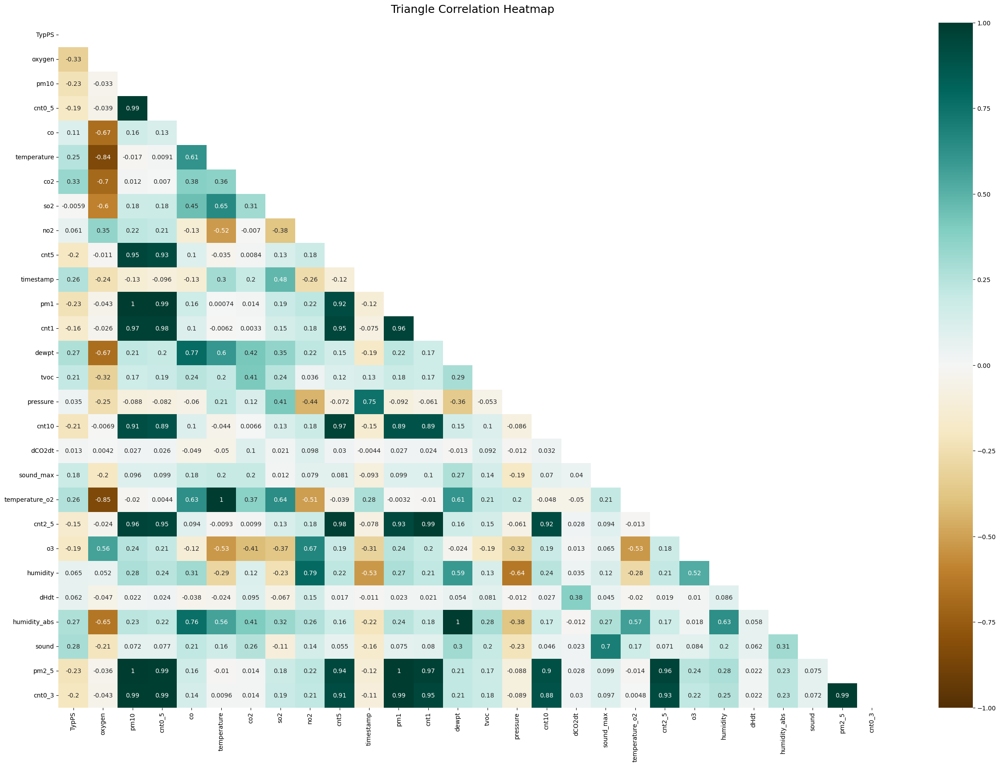

In [46]:
analyticshander.triangle_correlation_heatmap()

___
Um die Korrelationen Ihrer Variablen zu ermitteln können Sie folgende Funktion verwenden. Dabei können Sie einen Threshold-Wert für den Korrelationsindex festlegen.

Optional kann hierbei zu jeder Korrelation ein Scatterplot erstellt werden. 

In [47]:
analyticshander.analyze_correlations(0.7)

Correlation between pm2_5 and pm10:                         0.9994639666877787
Correlation between temperature and temperature_o2:         0.9984382397502339
Correlation between dewpt and humidity_abs:                 0.9974224973842652
Correlation between pm2_5 and pm1:                          0.9963930133842033
Correlation between pm10 and pm1:                           0.9950186987606114
Correlation between pm1 and cnt0_3:                         0.9947638304471672
Correlation between cnt0_5 and pm1:                         0.9933911974256019
Correlation between pm2_5 and cnt0_5:                       0.9914906266343132
Correlation between cnt0_5 and cnt0_3:                      0.9913909141431725
Correlation between pm2_5 and cnt0_3:                       0.9897446765018059
Correlation between cnt2_5 and cnt1:                        0.9888312936567635
Correlation between pm10 and cnt0_5:                        0.9885270875562272
Correlation between pm10 and cnt0_3:                

___
Wenn Sie einen Linechart benötigen dann steht für Sie folgende Funktion zur Verfügung. Dabei können Sie sich beliebig viele Variablen anzeigen lassen.

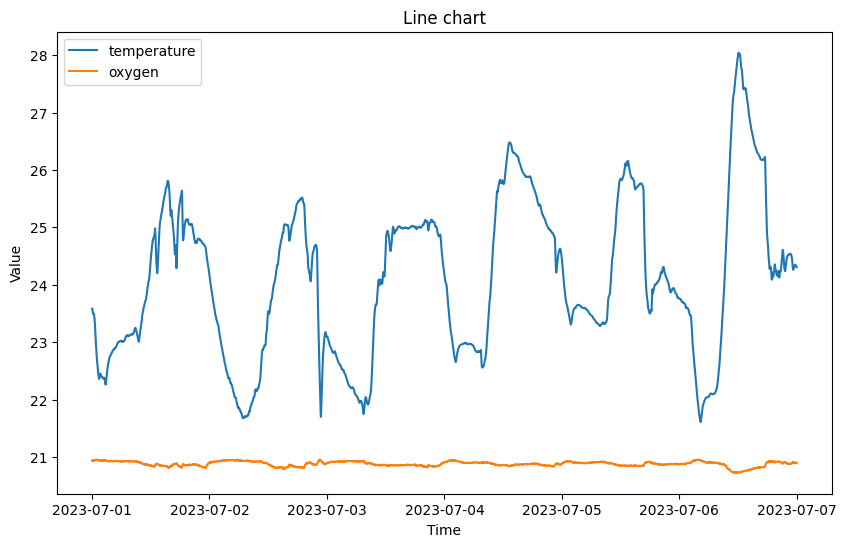

In [48]:
analyticshander.plot_line_chart(["temperature","oxygen"])

___
Manchmal kann es hilfreich sein eine Scatter-Matrix zu plotten um schnell bestimmte Korrelationen zu entdecken die durch den Korrelationsindex nicht entdeckt worden sind, da dieser nur Hinweise auf lineare Zusammenhänge entdeckt.

Die folgende Funktion verbraucht bei einem großen Datensatz erheblichen Rechenaufwand! Demendsprechend ist auch die Laufzeit (30 sec - 2 min)

In [49]:
#analyticshander.scatter_matrix()

___
Wenn das Verhältnis von Zwei Variablen genauer betrachten möchte, dann bietet sich diese Funktion an. Hierbei sieht man den Trend im Scatter-Plot und zusätzlich noch das Verhältnis der beiden Variablen im Line Chart. 

Correlation coefficient between temperature and oxygen: -0.8441872671116925


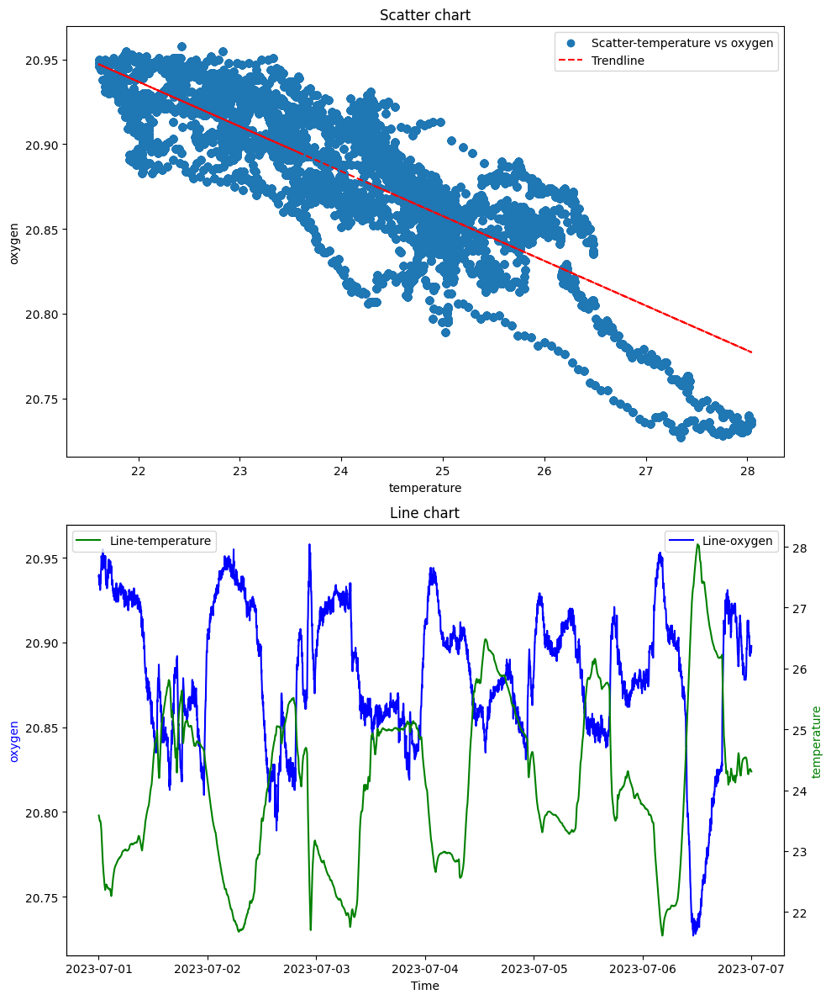

In [50]:
analyticshander.invesigate_correlation("temperature","oxygen",True)

___
Wenn Sie Ihre Datensätze auf gemeinsame und einzigartige Korrelationen untersuchen wollen, dann können Sie das mittels der compare_correlations-Funktion durchführen.

Hierbei kann dieser Funktion AnalyticsHandler-Objekte und Dataframes gleichzeitig zum analysieren übergeben werden.

In [51]:
home = dbhandler.db_data_to_df("home")
test = AnalyticsHandler.AnalyticsHandler(home)

test.compare_correlations([analyticshander],0.7)

Common correlations:
Correlation between cnt5 and cnt2_5: 0.9725858672971092
Correlation between pm10 and cnt10: 0.8837561526406771
Correlation between cnt10 and cnt1: 0.8607145334042409
Correlation between pm2_5 and cnt0_3: 0.9832554148048676
Correlation between cnt0_5 and cnt5: 0.9311642976540917
Correlation between cnt1 and cnt0_3: 0.9412470617086572
Correlation between pm2_5 and pm10: 0.9992649660467362
Correlation between cnt5 and cnt0_3: 0.9077322003835995
Correlation between cnt0_5 and cnt1: 0.977252409434898
Correlation between temperature and oxygen: -0.7739669011560055
Correlation between pm2_5 and cnt10: 0.8726855857570549
Correlation between cnt5 and pm1: 0.9140875095248342
Correlation between pm2_5 and cnt2_5: 0.9525823248795329
Correlation between cnt2_5 and cnt1: 0.9886295597312523
Correlation between pm1 and cnt0_3: 0.9889356032430671
Correlation between cnt5 and cnt10: 0.9594310913588233
Correlation between pm2_5 and cnt0_5: 0.9894270778329415
Correlation between pm10 

___
Zum Abschluss gibt es noch die Möglichkeit Ihren Datensatz nach Anomalien durchsuchen zu lassen. Dabei wird rollierend, eine von Ihnen definierte Zeitspanne, mit der Korrelation des gesamten Datensatzes verglichen. Die abweichende Korrelation können Sie dabei auch definieren.

Zudem können Sie die Analyse für alle Variablen im Datensatz oder nur für bestimmte Variablen durchführen lassen.

In [52]:
# Für eine einzige Variable
test.find_anomalies('1H', 0.1, 'humidity')


In [53]:
# Für mehrere Variablen
test.find_anomalies('1H', 0.4, ['temperature', 'humidity'])


Anomaly detected between temperature and humidity at 2023-06-24 02:01:10 - 2023-06-24 02:59:18: Correlation difference of -0.5765035931938718
Anomaly detected between humidity and temperature at 2023-06-24 02:01:10 - 2023-06-24 02:59:18: Correlation difference of -0.5765035931938718
Anomaly detected between temperature and humidity at 2023-06-24 03:01:19 - 2023-06-24 03:59:29: Correlation difference of 0.8940387778540966
Anomaly detected between humidity and temperature at 2023-06-24 03:01:19 - 2023-06-24 03:59:29: Correlation difference of 0.8940387778540966
Anomaly detected between temperature and humidity at 2023-06-24 04:01:28 - 2023-06-24 04:59:37: Correlation difference of -0.4889260578599201
Anomaly detected between humidity and temperature at 2023-06-24 04:01:28 - 2023-06-24 04:59:37: Correlation difference of -0.4889260578599201
Anomaly detected between temperature and humidity at 2023-06-24 05:01:38 - 2023-06-24 05:59:46: Correlation difference of -0.5699904826736728
Anomaly 

In [54]:
# Für alle Variablen
test.find_anomalies('1H', 0.4)


Anomaly detected between TypPS and pm10 at 2023-06-24 02:01:10 - 2023-06-24 02:59:18: Correlation difference of 0.4822187094560056
Anomaly detected between TypPS and co at 2023-06-24 02:01:10 - 2023-06-24 02:59:18: Correlation difference of 0.5226250621394815
Anomaly detected between TypPS and temperature at 2023-06-24 02:01:10 - 2023-06-24 02:59:18: Correlation difference of 0.5497139748930691
Anomaly detected between TypPS and co2 at 2023-06-24 02:01:10 - 2023-06-24 02:59:18: Correlation difference of -0.7025798925025848
Anomaly detected between TypPS and so2 at 2023-06-24 02:01:10 - 2023-06-24 02:59:18: Correlation difference of 0.6401055067684139
Anomaly detected between TypPS and cnt5 at 2023-06-24 02:01:10 - 2023-06-24 02:59:18: Correlation difference of 0.9939452727893077
Anomaly detected between TypPS and tvoc at 2023-06-24 02:01:10 - 2023-06-24 02:59:18: Correlation difference of -0.4836625334377681
Anomaly detected between TypPS and cnt10 at 2023-06-24 02:01:10 - 2023-06-24 0